In [26]:
from ultralytics import YOLO
import cv2
import numpy as np
import imutils
from src import config, image_utils
from src.aruco_marker import ArucoMarker

In [27]:
# Chose Apple Metal Performance Shaders (MPS) if available, otherwise use CPU
# device = 'mps' if torch.backends.mps.is_available() else 'cpu'

# Use temporary CPU for now. There is some issue with MPS
device = 'cpu'

## Load image

In [28]:
img = cv2.imread('./../datasets/images/test/34.jpeg')
img = imutils.resize(img, width=1216)

## Load Aruco markers

In [29]:
marker = ArucoMarker(config.MARKER_ARUCO_DICT, img, config.MARKER_PERIMETER_IN_CM)

In [30]:
print("ArUco Perimeter: {}".format(marker.get_perimeter()))
print("Pixels per centimeter: {}".format(marker.get_pixels_per_centimeter()))

print("Width in px: {}".format(marker.get_width()))
print("Width in cm: {}".format(marker.get_width_in_cm()))
print("Height in px: {}".format(marker.get_height()))
print("Height in cm: {}".format(marker.get_height_in_cm()))

ArUco Perimeter: 149.73137283325195
Pixels per centimeter: 5.347549029758999
Width in px: 37.33630940518894
Width in cm: 6.981948028416974
Height in px: 37.05401462729781
Height in cm: 6.929158465138514


## Draw Aruco markers

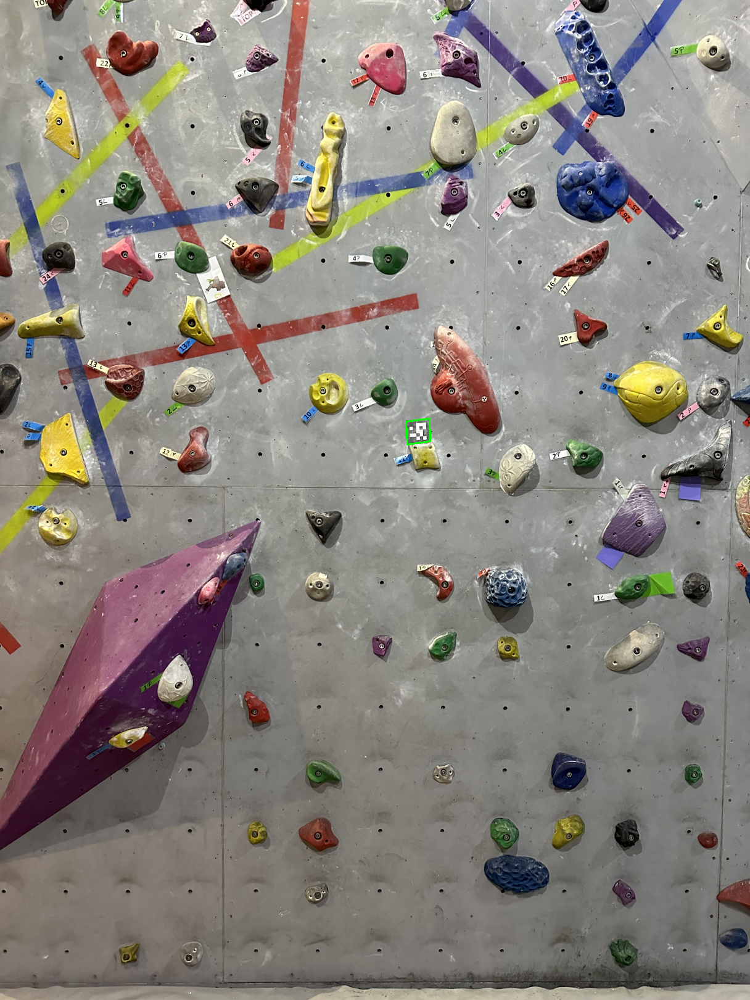

In [31]:
marker.draw_bounding_box(img, config.MARKER_BBOX_COLOR, config.LINE_WIDTH)
image_utils.display_image(img)

## Load pretrained YOLOv9 model

In [32]:
model = YOLO(config.YOLO_MODEL_PATH)

## Predict

In [33]:
results = model(
    img, 
    device=device, 
    conf=0.98,
    imgsz=1216
)

0: 1216x928 170 holds, 1 volume, 4516.6ms
Speed: 7.4ms preprocess, 4516.6ms inference, 1.6ms postprocess per image at shape (1, 3, 1216, 928)


## Get first result

In [34]:
result = results[0]

In [35]:
print(result.names)

{0: 'hold', 1: 'volume'}


# Draw bounding boxes

In [36]:
bboxes = np.array(result.boxes.xyxy.cpu(), dtype=int)
classes = np.array(result.boxes.cls.cpu(), dtype=int)
centers = (bboxes[:, :2] + bboxes[:, 2:]) / 2

image_utils.draw_bboxes(
    img, 
    bboxes, 
    classes, 
    result.names,
    centers, 
    config.BBOX_COLOR, 
    config.BBOX_CENTER_COLOR, 
    config.LINE_WIDTH
)

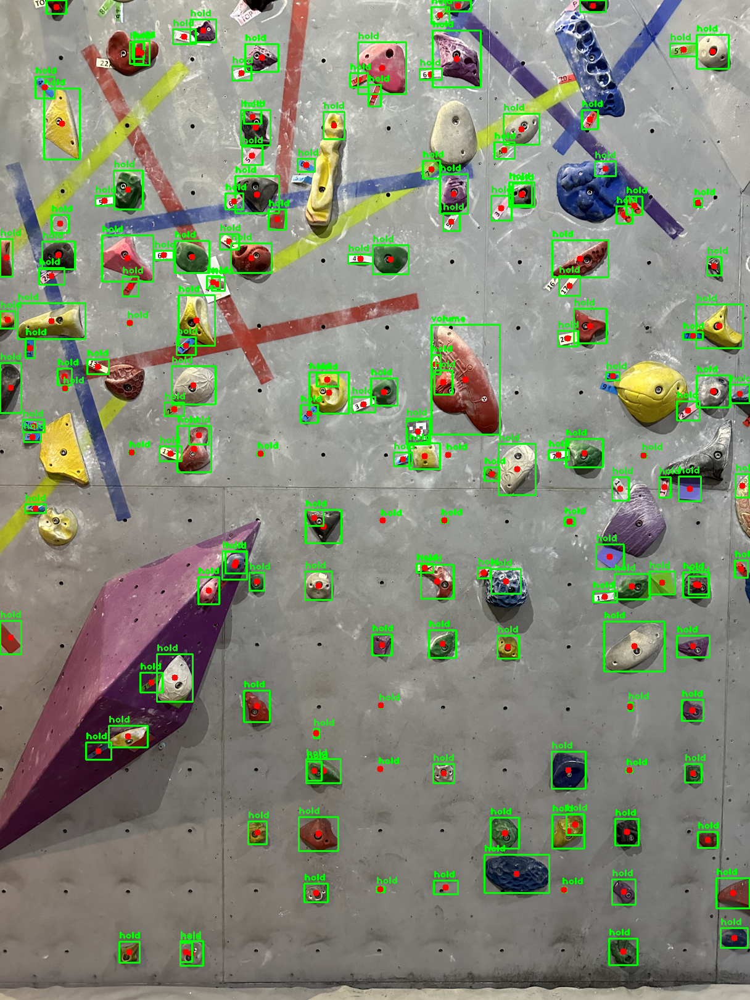

In [37]:
image_utils.display_image(img)

In [38]:
# 20% of bottom boxes from image
bottom_boxes = bboxes[bboxes[:, 3] > 0.8 * img.shape[0]]
bottom_classes = classes[bboxes[:, 3] > 0.8 * img.shape[0]]
bottom_centers = centers[bboxes[:, 3] > 0.8 * img.shape[0]]
start_bboxes_boxes_colors = (255, 0, 255)

# image_utils.draw_bboxes(
#     img, 
#     bottom_boxes, 
#     bottom_classes, 
#     result.names,
#     bottom_centers, 
#     bboxes_boxes_colors, 
#     config.BBOX_CENTER_COLOR, 
#     config.LINE_WIDTH
# )

In [39]:
# get two random bottom boxes
random_starting_steps_ids = np.random.choice(bottom_boxes.shape[0], 2, replace=False)
random_starting_steps_boxes = bottom_boxes[random_starting_steps_ids]
random_starting_steps_classes = bottom_classes[random_starting_steps_ids]
random_starting_steps_centers = bottom_centers[random_starting_steps_ids]

image_utils.draw_bboxes(
    img, 
    random_starting_steps_boxes, 
    random_starting_steps_classes, 
    result.names,
    random_starting_steps_centers, 
    start_bboxes_boxes_colors, 
    config.BBOX_CENTER_COLOR, 
    config.LINE_WIDTH
)

In [40]:
# get 20% above bottom boxes to 50% above bottom boxes
above_bottom_boxes = bboxes[(bboxes[:, 3] < 0.8 * img.shape[0]) & (bboxes[:, 3] > 0.5 * img.shape[0])]
above_bottom_classes = classes[(bboxes[:, 3] < 0.8 * img.shape[0]) & (bboxes[:, 3] > 0.5 * img.shape[0])]
above_bottom_centers = centers[(bboxes[:, 3] < 0.8 * img.shape[0]) & (bboxes[:, 3] > 0.5 * img.shape[0])]

# image_utils.draw_bboxes(
#     img, 
#     above_bottom_boxes, 
#     above_bottom_classes, 
#     result.names,
#     above_bottom_centers, 
#     (125, 125, 255), 
#     config.BBOX_CENTER_COLOR, 
#     config.LINE_WIDTH
# )

In [41]:
# get two random above bottom boxes
random_starting_holds_ids = np.random.choice(above_bottom_boxes.shape[0], 2, replace=False)
random_starting_holds_boxes = above_bottom_boxes[random_starting_holds_ids]
random_starting_holds_classes = above_bottom_classes[random_starting_holds_ids]
random_starting_holds_centers = above_bottom_centers[random_starting_holds_ids]

image_utils.draw_bboxes(
    img, 
    random_starting_holds_boxes, 
    random_starting_holds_classes, 
    result.names,
    random_starting_holds_centers, 
    start_bboxes_boxes_colors, 
    config.BBOX_CENTER_COLOR, 
    config.LINE_WIDTH
)

## Draw the preview

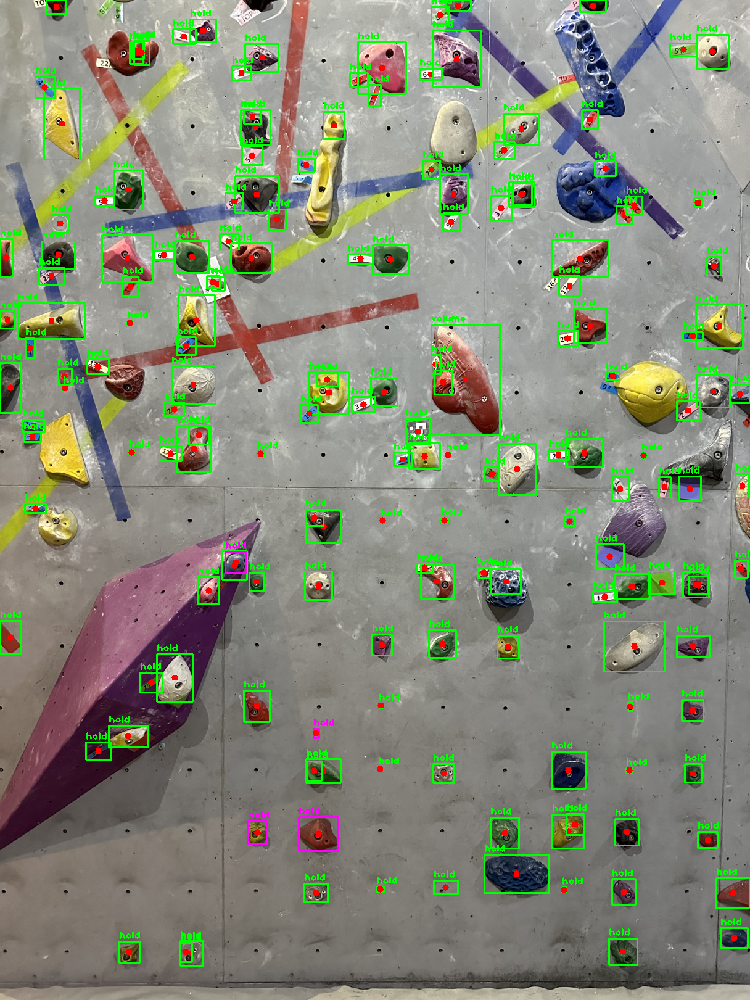

In [42]:
image_utils.display_image(img)